# 6521603795 นายปฏิพัทธ์ เอี่ยมรัมย์
# lab8

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
#import cancer data from kaggle 
df = pd.read_csv('./Cancer_Data.csv')
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [14]:
sns.pairplot(df)

<Axes: xlabel='smoothness_mean', ylabel='concavity_mean'>

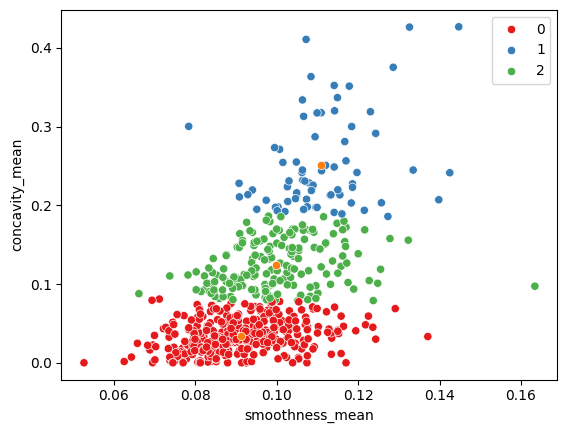

In [13]:
# 1.สร้าง K-mean จาก data โดยใช้ 2 col พร้อมวาดกราฟ เลือก col ที่แบ่งชัดเจน
from sklearn.cluster import KMeans

df2 = df[ ['smoothness_mean','concavity_mean']]
model = KMeans(n_clusters=3, random_state=0)
model.fit(df2)
sns.scatterplot(data = df2, x='smoothness_mean', y = 'concavity_mean', hue = model.labels_, palette = 'Set1')
sns.scatterplot(x = model.cluster_centers_[:,0], y = model.cluster_centers_[:,1])

In [37]:
# 2 สร้าง k-mean จาก  data โดยใช้ 3 col ขึ้นไป โชว์ค่า score มากกว่า 0.5
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df3 = df[ ['radius_mean','texture_mean', 'area_mean']]
df3[['radius_mean','texture_mean', 'area_mean']] = scaler.fit_transform(df3)



for k in range(2,11):
    model = KMeans(n_clusters=k, random_state=0)
    model.fit(df3)
    score = metrics.silhouette_score(df3, model.labels_)
    
    print('K = ',k, 'score = ',score )

    

C:\Users\francis\AppData\Local\Temp\ipykernel_7856\3137854071.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[['radius_mean','texture_mean', 'area_mean']] = scaler.fit_transform(df3)


K =  2 score =  0.5024713434090203
K =  3 score =  0.3952665846368692
K =  4 score =  0.32501298857422034
K =  5 score =  0.32751981699636545
K =  6 score =  0.3304174046540058
K =  7 score =  0.34647780964608027
K =  8 score =  0.34449168557026155
K =  9 score =  0.34878471257420196
K =  10 score =  0.3275921459275659
